In [1]:
import argparse
import json
import os
import pickle
import shutil
import subprocess
import sys
from dataclasses import dataclass
from typing import Any, Dict, List, Optional
import matplotlib.pyplot as plt
import cv2
import hydra
import glob
import numpy as np
from PIL import Image
import pandas as pd
from ego4d.internal.colmap.preprocess import download_andor_generate_streams

from ego4d.internal.human_pose.bbox_detector import DetectorModel
from ego4d.internal.human_pose.camera import (
    batch_xworld_to_yimage,
    create_camera,
    create_camera_data,
    create_customized_camera,
    get_aria_camera_models,
)
from ego4d.internal.human_pose.config import Config
from ego4d.internal.human_pose.dataset import (
    get_synced_timesync_df,
    SyncedEgoExoCaptureDset,
)
from ego4d.internal.human_pose.pose_estimator import PoseModel
from ego4d.internal.human_pose.readers import read_frame_idx_set
from ego4d.internal.human_pose.triangulator import Triangulator
from ego4d.internal.human_pose.utils import (
    check_and_convert_bbox,
    draw_bbox_xyxy,
    draw_points_2d,
    get_exo_camera_plane,
    get_region_proposal,
    get_bbox_fromKpts,
    get_two_small_bboxes,
    aria_rotate_kpts,
    left_right_bboxes_div,
    get_largest_bboxes
)

from iopath.common.file_io import PathManager
from iopath.common.s3 import S3PathHandler
from tqdm.auto import tqdm

from mmdet.apis import inference_detector, init_detector

pathmgr = PathManager()
%matplotlib inline

/home/jinxu/miniconda3/envs/human_pose/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/jinxu/code/Ego4d/ego4d/internal/colmap/preprocess.py:645: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(config_path="configs", config_name=None)


apex is not installed
apex is not installed
apex is not installed


#### Demo: Human body bbox detection

In [3]:
################################################################
test_case = '0630_Cooking_4'
exo_cam_names = ['cam01','cam02','cam03','cam04','cam06']
################################################################

# Load camera image path
dataset_dir = os.path.join('/mnt/shared/ego4dData/cache', f'{test_case}', 'dataset')
dset = {curr_cam : sorted(glob.glob(os.path.join(dataset_dir, 'frames', curr_cam, '*'))) for curr_cam in exo_cam_names}

# Load detector
detector_config = "external/mmlab/mmpose/demo/mmdetection_cfg/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco.py"
detector_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth'
detector = init_detector(detector_config, detector_checkpoint, device='cuda:0')

load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth


In [ ]:
######################
rand_idx = 33
rand_cam = 'cam02'
######################

image_path = dset[rand_cam][rand_idx]
det_results = inference_detector(detector, image_path)
curr_bbox = det_results[0].flatten()[:4]

original_img = cv2.imread(image_path)
bbox_img = draw_bbox_xyxy(original_img, curr_bbox)

plt.figure()
plt.imshow(bbox_img[:,:,::-1])

**Manually change incorrect bbox and vis_bbox**

In [ ]:
# ################ Manually change human body bbox ################
# # Load in first-time bboxes prediction
# bbox_dir = os.path.join(dataset_dir, 'body/bbox')
# bbox_file = os.path.join(bbox_dir, "bbox.pkl")
# with open(bbox_file, "rb") as f:
#     body_bboxes = pickle.load(f)

# # Iterate through manually picked index and correct them
# for idx in [33,75,78]:
#     body_bboxes[idx]['cam02'] = body_bboxes[idx-1]['cam02'] 

# # Save corrected bbox result
# with open(os.path.join(bbox_dir, "bbox.pkl"), "wb") as f:
#     pickle.dump(body_bboxes, f)

In [ ]:
# with open(bbox_file, "rb") as f:
#     bboxes = pickle.load(f)
# vis_bbox_dir = os.path.join(dataset_dir, 'body/vis_bbox')

# ###########################
# exo_camera_name = 'cam02'
# manuall_change_idx = [33,75,78]
# ###########################

# for curr_idx in manuall_change_idx:
#     vis_bbox_cam_dir = os.path.join(vis_bbox_dir, exo_camera_name)
#     cv2.imwrite(os.path.join(vis_bbox_cam_dir, f"{curr_idx:05d}.jpg"), bbox_img)

#### Demo: wholebody-Hand pose2d estimation 

In [85]:
################################################################
test_case = '0630_Cooking_4'
exo_cam_names = ['cam01','cam02','cam03','cam04']
################################################################

# Load camera image path
dataset_dir = os.path.join('/mnt/shared/ego4dData/cache', f'{test_case}', 'dataset')
dset = {curr_cam : sorted(glob.glob(os.path.join(dataset_dir, 'frames', curr_cam, '*'))) for curr_cam in exo_cam_names}

# Hand pose2d model
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(
    hand_pose_config, 
    hand_pose_ckpt, 
    rgb_keypoint_thres=0.3, 
    rgb_keypoint_vis_thres=0.3)

# Body pose2d model
pose_config = "external/mmlab/mmpose/configs/wholebody/2d_kpt_sview_rgb_img/topdown_heatmap/coco-wholebody/hrnet_w48_coco_wholebody_384x288_dark_plus.py"
pose_checkpoint = "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth"
body_pose_model = PoseModel(
    pose_config, 
    pose_checkpoint, 
    rgb_keypoint_thres=0.7, 
    rgb_keypoint_vis_thres=0.7)

# Load body pose2d estimation result
pose2d_file = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/dataset', 'body/pose2d', 'pose2d.pkl')
assert os.path.exists(pose2d_file), f"{pose2d_file} does not exist"
with open(pose2d_file, "rb") as f:
        poses2d = pickle.load(f)

bbox_dir = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/dataset', 'body/bbox')
bbox_file = os.path.join(bbox_dir, "bbox.pkl")
with open(bbox_file, "rb") as f:
    bboxes = pickle.load(f)

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth
load checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth


Left hand:

[0.9367324  0.92590016 0.8633765  0.8578527  0.84775364 0.91364515
 0.9171072  0.9331241  0.89479923 0.90117896 0.88522077 0.874048
 0.8316097  0.9306631  0.86387384 0.82662284 0.79472256 0.9237976
 0.88714623 0.84995854 0.81749946]

Right hand:

[0.5877397  0.54429114 0.55479836 0.56475425 0.551821   0.5400426
 0.5530174  0.5462159  0.57870936 0.569956   0.5689032  0.5608796
 0.56825817 0.5908657  0.5789116  0.55325943 0.5190069  0.5551249
 0.56158006 0.5357125 ]


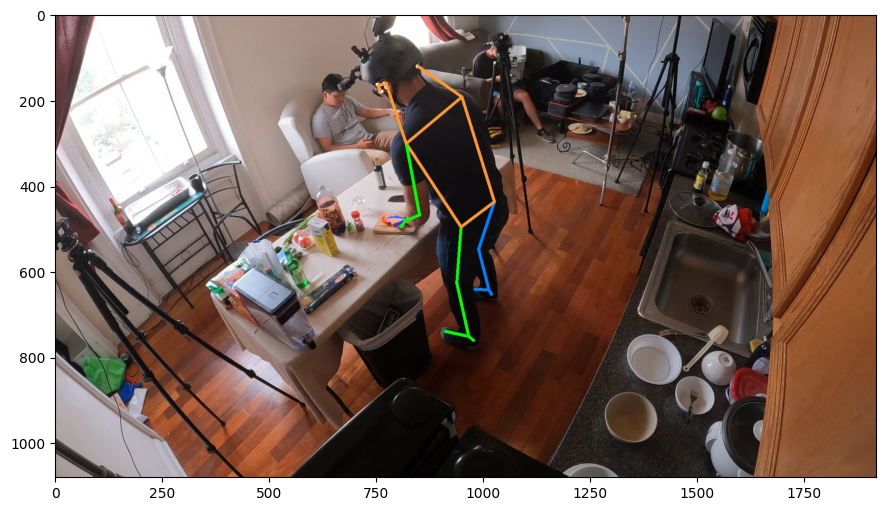

In [87]:
#######################
rand_idx = 210
rand_cam = 'cam03'
#######################
rand_img_path = dset[rand_cam][rand_idx]
rand_img = cv2.imread(rand_img_path)

curr_pose2d = poses2d[rand_idx][rand_cam]
curr_bbox = np.zeros(5) # np.append(bboxes[rand_idx][rand_cam], 1)
pose_results = [{'bbox': curr_bbox,
                 "keypoints":curr_pose2d}]
# Visualization
save_path = 'transfer_test/body_pose2d_vis.jpg'
body_pose_model.draw_poses2d(pose_results, rand_img, save_path)

vis_img = cv2.imread(save_path)
plt.figure(figsize=(12,6))
plt.imshow(vis_img[:,:,::-1])

# Check hand confidence
print('Left hand:\n')
print(curr_pose2d[91:112,2])
print('\nRight hand:\n')
print(curr_pose2d[113:,2])

**Check left/right wholebody-Hand kpts separately for one exo camera**

==================== Summary for cam03 ====================
Bbox conf-mean distance:  98.65941

Right hand kpts confidence:
 [0.5417626  0.5877397  0.54429114 0.55479836 0.56475425 0.551821
 0.5400426  0.5530174  0.5462159  0.57870936 0.569956   0.5689032
 0.5608796  0.56825817 0.5908657  0.5789116  0.55325943 0.5190069
 0.5551249  0.56158006 0.5357125 ]

Left hand kpts confidence:
 [0.9367324  0.92590016 0.8633765  0.8578527  0.84775364 0.91364515
 0.9171072  0.9331241  0.89479923 0.90117896 0.88522077 0.874048
 0.8316097  0.9306631  0.86387384 0.82662284 0.79472256 0.9237976
 0.88714623 0.84995854 0.81749946]

right_conf_mean:  0.5583624
left_conf_mean:  0.87983966


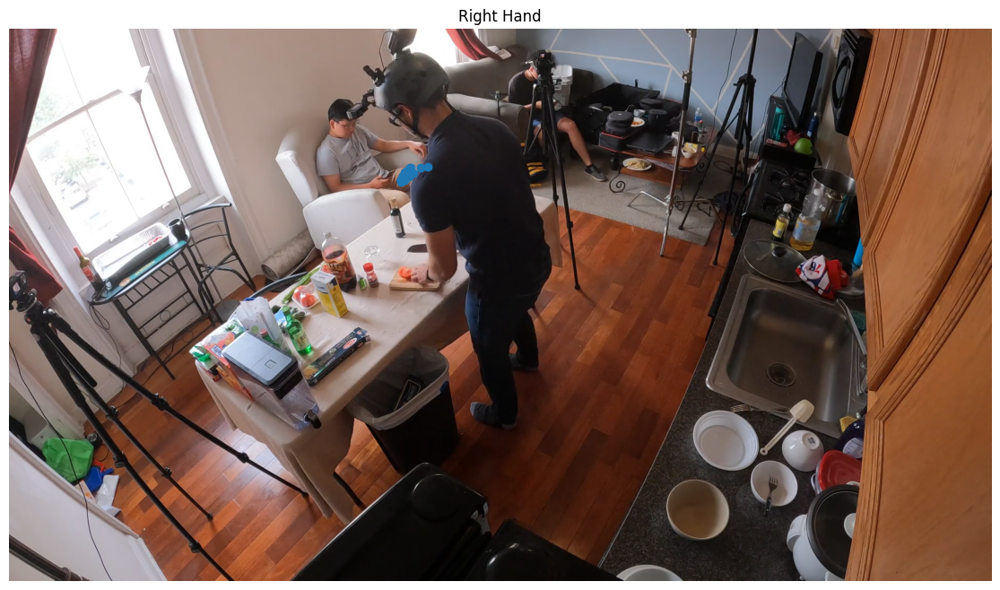

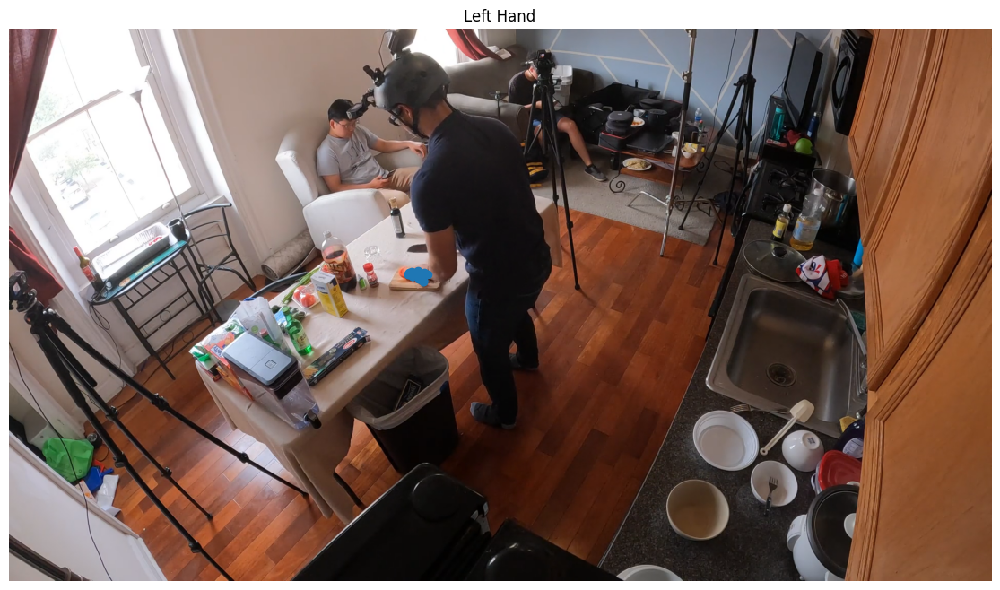

In [88]:
curr_pose2d = poses2d[rand_idx][rand_cam][-42:]

# Right hand visualization
vis_name = "right_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
vis_pose2d_res = {'bbox':np.zeros(5),
                  'keypoints':curr_pose2d[21:]}
# hand_pose_model.draw_poses2d([vis_pose2d_res], vis_twoHand, save_path)
plt.figure(figsize=(16,8))
plt.scatter(curr_pose2d[21:][:,0], curr_pose2d[21:][:,1])
plt.imshow(vis_twoHand[:,:,::-1])
plt.title('Right Hand')
plt.axis('off')

# Left hand visualization
vis_name = "left_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
vis_pose2d_res = {'bbox':np.zeros(5),
                  'keypoints':curr_pose2d[:21]}
# hand_pose_model.draw_poses2d([vis_pose2d_res], vis_twoHand, save_path)
plt.figure(figsize=(16,8))
plt.scatter(curr_pose2d[:21][:,0], curr_pose2d[:21][:,1])
plt.imshow(vis_twoHand[:,:,::-1])
plt.title('Left Hand')
plt.axis('off')

# Confidence of each hand kpts
right_hand_pos2d_kpts, left_hand_pos2d_kpts = curr_pose2d[21:], curr_pose2d[:21]
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]
print(f"==================== Summary for {rand_cam} ====================")
print('Bbox conf-mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

#### Demo: Body pose2d estimation

In [45]:
################################################################
test_case = '0630_Cooking_4'
exo_cam_names = ['cam01','cam02','cam03','cam04']
################################################################

# Load camera image path
dataset_dir = os.path.join('/mnt/shared/ego4dData/cache', f'{test_case}', 'dataset')
dset = {curr_cam : sorted(glob.glob(os.path.join(dataset_dir, 'frames', curr_cam, '*'))) for curr_cam in exo_cam_names}

# Load detector
pose_config = "external/mmlab/mmpose/configs/wholebody/2d_kpt_sview_rgb_img/topdown_heatmap/coco-wholebody/hrnet_w48_coco_wholebody_384x288_dark_plus.py"
pose_checkpoint = "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth"
body_pose_model = PoseModel(
    pose_config, 
    pose_checkpoint, 
    rgb_keypoint_thres=0.7, 
    rgb_keypoint_vis_thres=0.7)

# Load body bbox
bbox_dir = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/dataset', 'body/bbox')
bbox_file = os.path.join(bbox_dir, "bbox.pkl")
with open(bbox_file, "rb") as f:
    bboxes = pickle.load(f)

load checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth


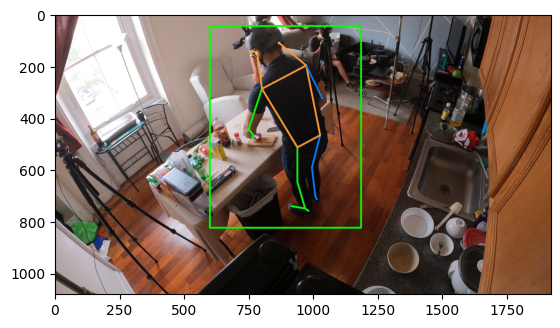

In [46]:
#######################
rand_idx = 18
rand_cam = 'cam03'
#######################

rand_img_path = dset[rand_cam][rand_idx]
rand_img = cv2.imread(rand_img_path)

# Load in body bbox 
bbox_xyxy = bboxes[rand_idx][rand_cam]  # x1, y1, x2, y2
if bbox_xyxy is not None:
    # add confidence score to the bbox
    bbox_xyxy = np.append(bbox_xyxy, 1.0)

    # Inference to get body 2d kpts
    pose_results = body_pose_model.get_poses2d(
        bboxes=[{"bbox": bbox_xyxy}],
        image_name=rand_img_path,
    )
    assert len(pose_results) == 1
    # Save results and visualization
    save_path = f'temp_vis_dir/body_pose2d_{test_case}_{rand_cam}.jpg'
    # vis_pose2d_dir = os.path.join(dataset_dir, 'body/vis_pose2d')
    # vis_pose2d_cam_dir = os.path.join(vis_pose2d_dir, rand_cam)
    # save_path = os.path.join(vis_pose2d_cam_dir, f"{rand_idx:05d}.jpg")
    body_pose_model.draw_poses2d(pose_results, rand_img, save_path)


plt.figure()
plt.imshow(cv2.imread(save_path)[:,:,::-1])
# # Check hand confidence
# print('Left hand:\n')
# print(curr_pose2d[91:112,2])
# print('\nRight hand:\n')
# print(curr_pose2d[113:,2])

**Manually change body pose2d estimation result**

In [5]:
# Load first-time pose2d result
pose2d_dir = f'/mnt/shared/ego4dData/cache/{test_case}/dataset/body/pose2d'
pose2d_file = os.path.join(pose2d_dir, "pose2d.pkl")
with open(pose2d_file, "rb") as f:
    poses2d = pickle.load(f)

# Load in first-time bboxes prediction
bbox_dir = os.path.join(dataset_dir, 'body/bbox')
bbox_file = os.path.join(bbox_dir, "bbox.pkl")
with open(bbox_file, "rb") as f:
    body_bboxes = pickle.load(f)


######################################
manuall_change_idx = [33,75,78]
exo_cam_names = ['cam02']
######################################

# Iterate through manually picked index and correct them
for manual_idx in manuall_change_idx:
    for exo_camera_name in exo_cam_names:
        image_path = dset[exo_camera_name][manual_idx]
        # Inference with updated bbox
        bbox_xyxy = body_bboxes[manual_idx][exo_camera_name]  # x1, y1, x2, y2
        if bbox_xyxy is not None:
            # add confidence score to the bbox
            bbox_xyxy = np.append(bbox_xyxy, 1.0)
            # Inference to get body 2d kpts
            pose_results = body_pose_model.get_poses2d(
                bboxes=[{"bbox": bbox_xyxy}],
                image_name=image_path,
            )
            pose_result = pose_results[0]
            pose2d = pose_result["keypoints"]
        else:
            pose2d = None

    poses2d[manual_idx][exo_camera_name] = pose2d

In [9]:
with open(os.path.join(pose2d_dir, "pose2d.pkl"), "wb") as f:
    pickle.dump(poses2d, f)

#### Demo: Hand pose2d estimation for Exo camera

The existing code `mode_pose2d()` from Meta is sufficient to get reasonable human body pose estimation results. For our case, transforming from body to hand is needed.

In [96]:
########### Parameter ###########
scenario = '0630_Cooking_4'
exo_cam_names = ['cam01','cam02','cam03','cam04']
kpts_vis_threshold = 0.1
#################################

# Directory setup and load parameters
dataset_root = '/mnt/shared/ego4dData/cache'
dataset_root = dataset_root
dataset_dir = os.path.join(dataset_root, scenario, 'dataset')
calib_result_dir = os.path.join(dataset_root, scenario, 'dataset/calib_results')
exo_cam_names = ['cam01','cam02','cam03','cam04']

# Load human body keypoints result from mode_pose2d
pose2d_dir = f'/mnt/shared/ego4dData/cache/{scenario}/dataset/body/pose2d'
pose2d_file = os.path.join(pose2d_dir, "pose2d.pkl")
assert os.path.exists(pose2d_file), f"{pose2d_file} does not exist"
with open(pose2d_file, "rb") as f:
    poses2d = pickle.load(f)

# Set up image path loader
dset = {curr_cam : sorted(glob.glob(os.path.join(dataset_dir, 'frames', curr_cam, '*'))) for curr_cam in exo_cam_names}
# check number of images are consistent across different camera groups
num_img = len(dset[next(iter(dset))])
assert all(len(dset[k]) == num_img for k in dset), "Not all cameras have same number of images"

########################################## Load in hand pose detector ##########################################
###### COCO Wholebody hand #####
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'

######### Onehand-10k ##########
# hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/onehand10k/res50_onehand10k_256x256.py'
# hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth'

hand_pose_model = PoseModel(hand_pose_config, 
                            hand_pose_ckpt, 
                            rgb_keypoint_thres=kpts_vis_threshold, 
                            rgb_keypoint_vis_thres=kpts_vis_threshold,
                            refine_bbox=False,
                            thickness=3)

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


Hand pose2d visualization with visThresh=0.1


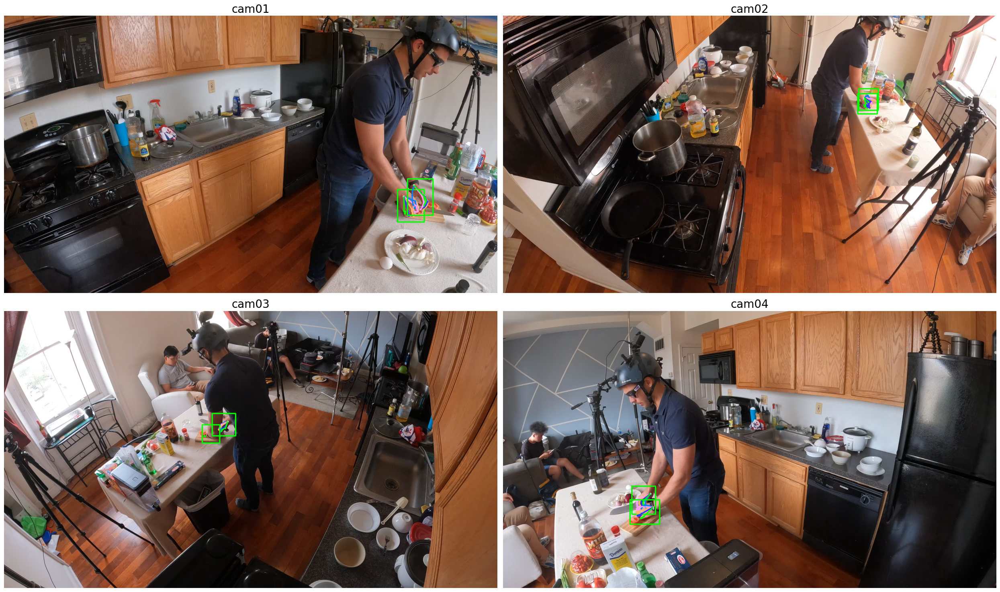

In [97]:
############### Load in image ###############
rand_idx = 203
#############################################

print(f'Hand pose2d visualization with visThresh={kpts_vis_threshold}')
fig,axes=plt.subplots(2,2,figsize=(25,15))
vis_exo_pose2d ={}
for idx,rand_cam in enumerate(exo_cam_names):
    # Load in image
    img_path = dset[rand_cam][rand_idx]
    rand_img = np.array(Image.open(img_path))

    ########################## Heuristic Hand bbox ##########################
    # Pose2d keypoints
    body_pose_kpts = poses2d[rand_idx][rand_cam]
    # Extract keypoints for only left hand according to https://github.com/jin-s13/COCO-WholeBody/tree/master#what-is-coco-wholebody
    # Right hand kpts
    right_hand_kpts_index = list(range(112,132))
    right_hand_kpts = body_pose_kpts[right_hand_kpts_index,:]
    # Left hand kpts
    left_hand_kpts_index = list(range(91,111))
    left_hand_kpts = body_pose_kpts[left_hand_kpts_index,:]
    # Heuristic hand bboxes
    img_H, img_W = rand_img.shape[:2]
    right_hand_bbox = get_bbox_fromKpts(right_hand_kpts, img_W, img_H, padding=25)
    left_hand_bbox = get_bbox_fromKpts(left_hand_kpts, img_W, img_H, padding=25)

    # # Visualization - bbox with Wholebody-hand kpts for two hands
    # vis_img = rand_img.copy()
    # vis_img = draw_bbox_xyxy(vis_img, right_hand_bbox, color=(255,0,0))
    # vis_img = draw_bbox_xyxy(vis_img, left_hand_bbox, color=(0,0,255))
    # plt.figure(figsize=(12,6))
    # plt.imshow(vis_img)
    # plt.scatter(right_hand_kpts[:,0], right_hand_kpts[:,1], s=3, color='r', label='right_hand_kpts')
    # plt.scatter(left_hand_kpts[:,0], left_hand_kpts[:,1], s=3, color='b', label='left_hand_kpts')
    # plt.legend()

    ########################## Hand pose2d estimation ##########################
    # Append confience score to bbox 
    bbox_xyxy_right = np.append(right_hand_bbox, 1)
    bbox_xyxy_left = np.append(left_hand_bbox, 1)
    two_hand_bboxes=[{"bbox": bbox_xyxy_right},
                    {"bbox": bbox_xyxy_left}]
    # Hand pose estimation
    pose_results = hand_pose_model.get_poses2d(
                        bboxes=two_hand_bboxes,
                        image_name=img_path,
                    )
    vis_exo_pose2d[rand_cam] = pose_results
    # Visualization
    vis_name = f"two_hand_kpts_vis_{rand_cam}.png"
    save_path = f'transfer_test/{vis_name}'
    vis_twoHand = rand_img.copy()
    hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand[:,:,::-1], save_path)
    vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand[:,:,::-1], save_path)
    vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))

    col_idx = idx % 2
    row_idx = idx // 2
    axes[row_idx,col_idx].imshow(vis_twoHand)
    axes[row_idx,col_idx].set_axis_off()
    axes[row_idx,col_idx].set_title(rand_cam,fontsize=20)
fig.tight_layout()

**Check Left/Right hand pose2d estimation separately for one specific exo camera**

==================== Summary for cam03 ====================
Bbox conf-mean distance:  0.49430385

Right hand kpts confidence:
 [0.14397806 0.29797283 0.22112447 0.1303396  0.1175865  0.11871269
 0.14049514 0.12431814 0.07265618 0.15096942 0.12983453 0.13083294
 0.07849488 0.12578817 0.14123484 0.14821166 0.10322388 0.12488975
 0.1363958  0.15470962 0.11780582]

Left hand kpts confidence:
 [0.05047136 0.03467993 0.03305303 0.0344536  0.0349071  0.04445883
 0.06475489 0.04221664 0.02393371 0.05019531 0.07024534 0.05531171
 0.04408606 0.05016885 0.04351561 0.0640941  0.04789814 0.0838194
 0.14292268 0.16371661 0.07682767]

right_conf_mean:  0.13855118
left_conf_mean:  0.05979669


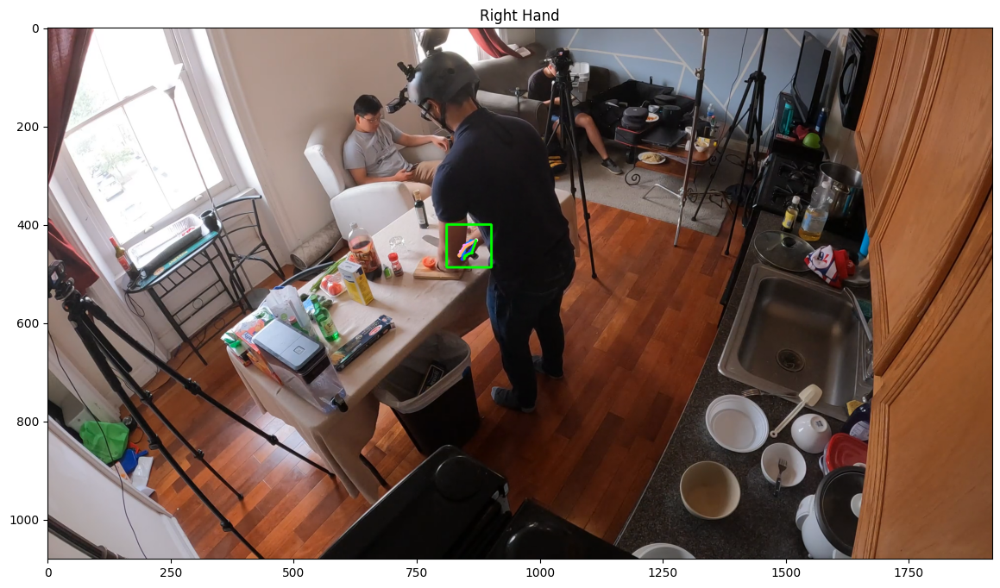

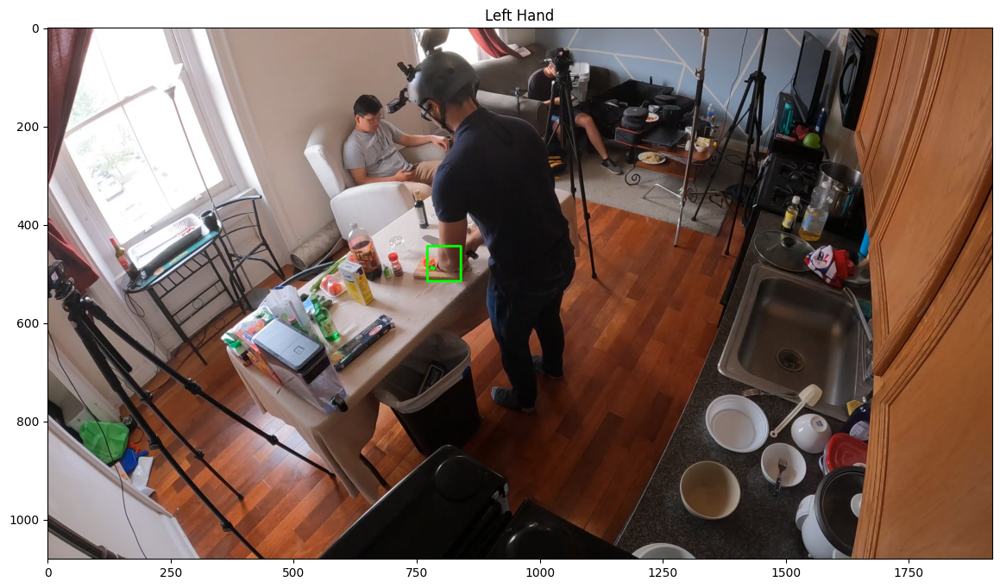

In [101]:
#############################
rand_cam = 'cam03'
#############################

img_path = dset[rand_cam][rand_idx]
rand_img = np.array(Image.open(img_path))

# Right hand visualization
vis_name = "right_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([vis_exo_pose2d[rand_cam][0]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(16,8))
plt.imshow(vis_twoHand)
plt.title('Right Hand')

# Left hand visualization
vis_name = "left_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([vis_exo_pose2d[rand_cam][1]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(16,8))
plt.imshow(vis_twoHand)
plt.title('Left Hand')

# Confidence of each hand kpts
right_hand_pos2d_kpts, left_hand_pos2d_kpts = vis_exo_pose2d[rand_cam][0]['keypoints'], vis_exo_pose2d[rand_cam][1]['keypoints']
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]
print(f"==================== Summary for {rand_cam} ====================")
print('Bbox conf-mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

**Exo camera hand pose2d estimation heuristics: Rotate image to make hand pointing upward (more general scene)**

In [ ]:
############### Load in image ###############
rand_idx = 145
rand_cam = 'cam01'
#############################################

########### 1. Visualization of rotated image and wholebody-hand kpts #################
img_path = dset[rand_cam][rand_idx]
rand_img = np.array(Image.open(img_path))


# Pose2d keypoints
body_pose_kpts = poses2d[rand_idx][rand_cam]
# Extract keypoints for only left hand according to https://github.com/jin-s13/COCO-WholeBody/tree/master#what-is-coco-wholebody
# Right hand kpts
right_hand_kpts_index = list(range(112,132))
right_hand_kpts = body_pose_kpts[right_hand_kpts_index,:]
# Left hand kpts
left_hand_kpts_index = list(range(91,111))
left_hand_kpts = body_pose_kpts[left_hand_kpts_index,:]


img_W, img_H = rand_img.shape[:2]
right_hand_bbox = get_bbox_fromKpts(right_hand_kpts, img_W, img_H)
left_hand_bbox = get_bbox_fromKpts(left_hand_kpts, img_W, img_H)

# Visualization - bbox with hand kpts for two hands
vis_img = rand_img.copy()
vis_img = draw_bbox_xyxy(vis_img, right_hand_bbox, color=(255,0,0))
vis_img = draw_bbox_xyxy(vis_img, left_hand_bbox, color=(0,0,255))
plt.figure(figsize=(12,6))
plt.imshow(vis_img)
plt.scatter(right_hand_kpts[:,0], right_hand_kpts[:,1], s=3, color='r', label='right_hand_kpts')
plt.scatter(left_hand_kpts[:,0], left_hand_kpts[:,1], s=3, color='b', label='left_hand_kpts')
plt.legend()

#### Demo: Hand pose2d estimation for Ego camera

In [9]:
########### Parameter ###########
scenario = '0630_Cooking_4'
#################################

# Directory setup and load parameters
dataset_root = '/mnt/shared/ego4dData/cache'
dataset_root = dataset_root
dataset_dir = os.path.join(dataset_root, scenario, 'dataset')
calib_result_dir = os.path.join(dataset_root, scenario, 'dataset/calib_results')
ego_cam_name = 'cam05'

# Datset
dset = sorted(glob.glob(os.path.join(dataset_dir, 'frames', ego_cam_name, '*')))
num_img = len(dset)

# Load hand bounding box detector
config_file = 'external/mmlab/mmpose/demo/mmdetection_cfg/cascade_rcnn_x101_64x4d_fpn_1class.py'
checkpoint_file = 'https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth'
detector = init_detector(config_file, checkpoint_file, device='cuda:0')

# Load hand pose estimation model
####### OneHand-10K #######
# hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/onehand10k/res50_onehand10k_256x256.py'
# hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth'
#### COCOWholeBody-Hand ####
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(hand_pose_config, 
                            hand_pose_ckpt, 
                            rgb_keypoint_thres=0.3, 
                            rgb_keypoint_vis_thres=0.3,
                            refine_bbox=False)

load checkpoint from http path: https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth
load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


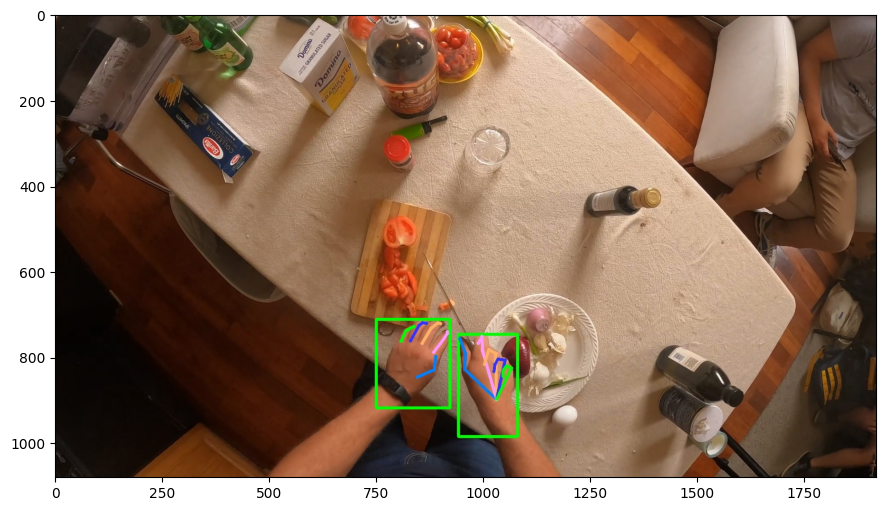

In [15]:
############### Load in image ###############
rand_idx = 297
save_name = 'ego_pose2d_vis'
#############################################


# Iterate through all aria rotated images
for idx in tqdm([rand_idx]):
    image_path = dset[idx]

    ############### Ego camera hand bbox detection ###############
    det_results = inference_detector(detector, image_path)
    # Refine detected bboxes to only two bboxes
    refined_two_bboxes = get_two_small_bboxes(det_results[0])
    right_left_bboxes = left_right_bboxes_div(refined_two_bboxes) # (2,4)
    # Visualization
    vis_bbox_img = cv2.imread(image_path)
    # color_map = [(255,0,0),(0,0,255)] 

    # # Get two smallest bbox
    # bbox_x_center = (det_results[0][:,0] + det_results[0][:,2]) / 2
    # sort_order = np.argsort(bbox_x_center)
    # two_smallest_bbox = det_results[0][sort_order[:2],:4]
    # right_left_bboxes = left_right_bboxes_div(two_smallest_bbox) # (2,4)

    # Visualization of bbox
    # color = [(255,0,0),(0,0,255)]
    # for ii, curr_hand_bbox in enumerate(right_left_bboxes):
    #     vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox[:4], color=color[ii])
    # plt.figure()
    # plt.imshow(vis_bbox_img[:,:,::-1])

    ################### Ego camera hand pose2d ###################
    # Format hand bbox
    two_hand_bboxes = [{'bbox':np.append(curr_hand_bbox,1)} for curr_hand_bbox in right_left_bboxes]
    # Hand pose estimation
    pose_results = hand_pose_model.get_poses2d(
                        bboxes=two_hand_bboxes,
                        image_name=image_path,
                    )

    # Visualization of hand pose2d
    save_path = os.path.join('transfer_test', f'{save_name}.jpg')
    vis_twoHand = cv2.imread(image_path)
    hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand, save_path)
    vis_twoHand = cv2.imread(save_path)
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand, save_path)
    vis_pose2d = cv2.imread(save_path)
    plt.figure(figsize=(12,6))
    plt.imshow(vis_pose2d[:,:,::-1])

**Check left and right hand kpts confidence**

Conf-Mean distance:  37.362865

Right hand kpts confidence:
 [0.35421944 0.5659486  0.6684636  0.66804373 0.6653913  0.5929233
 0.7386488  0.571454   0.30299363 0.66341543 0.8117981  0.42341918
 0.2447831  0.6306679  0.41733927 0.44201076 0.27722293 0.62205255
 0.4222576  0.39058873 0.30713785]

Left hand kpts confidence:
 [0.3652774  0.5111594  0.6016081  0.66441596 0.578463   0.55287933
 0.6210947  0.58741045 0.6907172  0.7427177  0.7208655  0.59222937
 0.5113717  0.6482941  0.68346345 0.46091005 0.44286436 0.41781297
 0.47912318 0.45818424 0.36837575]

right_conf_mean:  0.5133704
left_conf_mean:  0.55710655


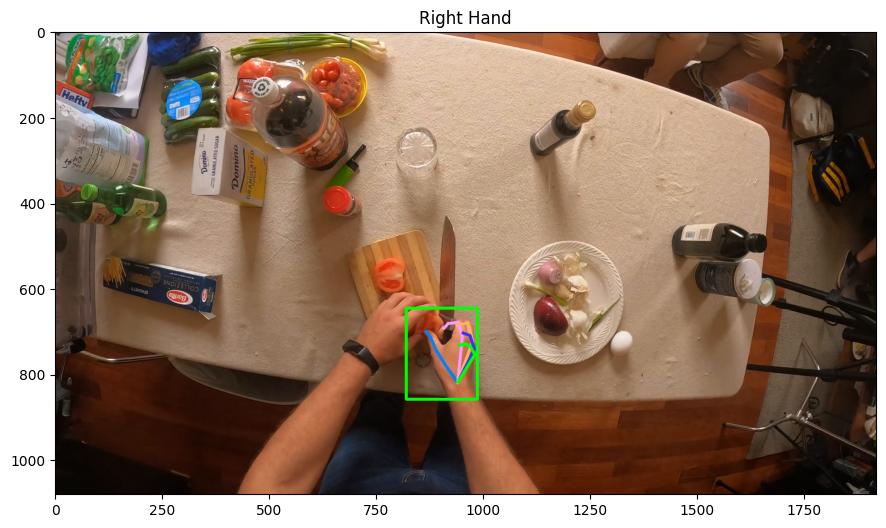

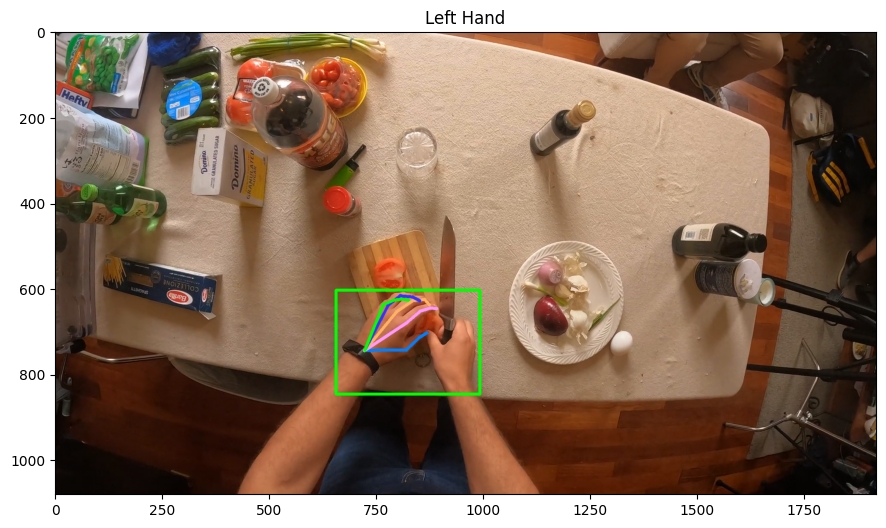

In [103]:
img_path = dset[rand_idx]
rand_img = np.array(Image.open(img_path))

# Right hand visualization
vis_name = f"right_hand_kpts_vis_ego_{scenario}.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(12,6))
plt.imshow(vis_twoHand)
plt.title('Right Hand')

# Left hand visualization
vis_name = f"left_hand_kpts_vis_ego_{scenario}.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(12,6))
plt.imshow(vis_twoHand)
plt.title('Left Hand')

# Confidence check
right_hand_pos2d_kpts, left_hand_pos2d_kpts = pose_results[0]['keypoints'], pose_results[1]['keypoints']
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]

print('Conf-Mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

**Manually change hand bbox and hand pose2d for Ego camera**

If the bbox detection for hand is problematic in the first-time pipeline, then we manually correct those bad bboxes results.

In [5]:
# Bad bbox in 0630_Cooking_4 cam05: [16, 17, 18, 67, 71, 72, 202, 204, 205, 229, 230, 241, 273, 274, 282, 284, 285, 286, 287]

# Load in first-time bbox detection
ego_hand_bbox_dir = os.path.join(dataset_dir, f'hand/bbox')
with open(os.path.join(ego_hand_bbox_dir, "ego_bbox.pkl"), "rb") as f:
        ego_hand_bboxes = pickle.load(f)

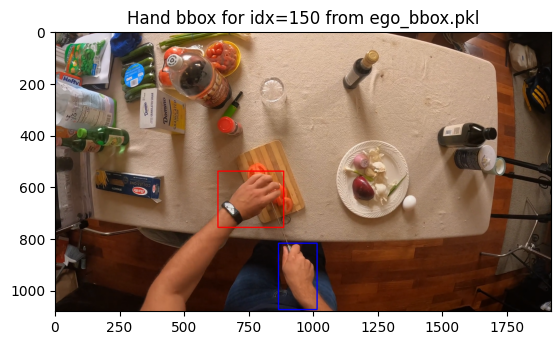

In [49]:
####################################
curr_corrected_idx = 150
####################################

# 1. VIsualization from ego_bbox.pkl
for idx in [curr_corrected_idx]:
    image_path = dset[idx]
    vis_bbox_img = cv2.imread(image_path)
    curr_hand_bbox = ego_hand_bboxes[idx]
    color = [(255,0,0),(0,0,255)]
    for ii, curr_bbox in enumerate(curr_hand_bbox):
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_bbox, color=color[ii])
    plt.figure()
    plt.imshow(vis_bbox_img[:,:,::-1])
    plt.title(f'Hand bbox for idx={curr_corrected_idx} from ego_bbox.pkl')

In [40]:
print(f'Previous frame (idx={curr_corrected_idx-1}) bbox:')
ego_hand_bboxes[curr_corrected_idx-1]

Previous frame (idx=296) bbox:


array([[ 918.68115,  763.60681, 1050.9174 , 1000.6051 ],
       [ 713.6416 ,  727.59656,  875.98401,  958.67804]])

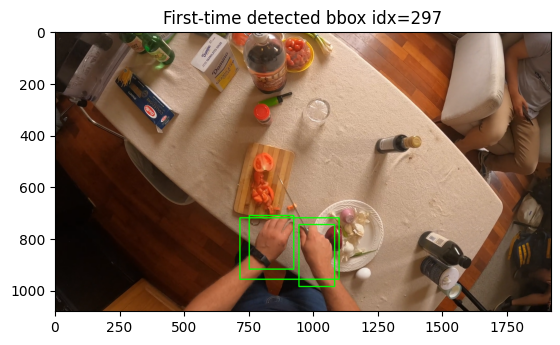

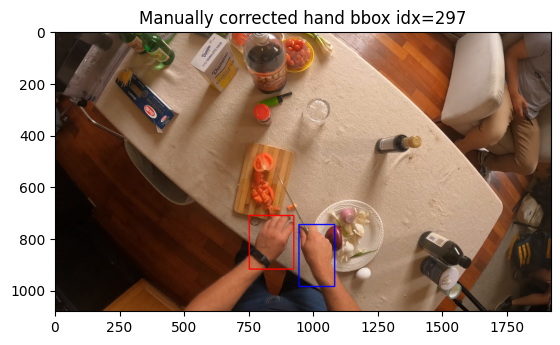

In [45]:
# 2. Visualization from pretrained detector
for idx in [curr_corrected_idx]:
    ############### Inference ###############
    image_path = dset[idx]
    # Check first-time detection
    det_results = inference_detector(detector, image_path)
    # Visualization
    vis_bbox_img = cv2.imread(image_path)
    for ii, curr_hand_bbox in enumerate(det_results[0]):
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox[:4],color=(0,255,0))
    plt.figure()
    plt.imshow(vis_bbox_img[:,:,::-1])
    plt.title(f'First-time detected bbox idx={idx}')

    ############### Manual Correction ###############
    vis_bbox_img = cv2.imread(image_path)
    manual_assign_rl_bbox = np.array([[9.4282904e+02, 7.4681592e+02, 1.0804587e+03, 9.8526086e+02],
                                      [7.5025879e+02, 7.1171869e+02, 9.2287341e+02, 9.1855084e+02]])
    color = [(255,0,0),(0,0,255)]
    for ii, curr_bbox in enumerate(manual_assign_rl_bbox):
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_bbox, color=color[ii])
    plt.figure()
    plt.imshow(vis_bbox_img[:,:,::-1])
    plt.title(f'Manually corrected hand bbox idx={idx}')

In [44]:
det_results

[array([[7.5025879e+02, 7.1171869e+02, 9.2287341e+02, 9.1855084e+02,
         9.9777454e-01],
        [9.4282904e+02, 7.4681592e+02, 1.0804587e+03, 9.8526086e+02,
         9.9614054e-01],
        [7.1455219e+02, 7.2012842e+02, 1.0973861e+03, 9.5756250e+02,
         5.8261108e-01]], dtype=float32)]

In [46]:
# 3. Change bbox.pkl
ego_hand_bboxes[curr_corrected_idx] = manual_assign_rl_bbox

In [50]:
# 4. Save new ego_bbox result
with open(os.path.join(ego_hand_bbox_dir, "ego_bbox_latest.pkl"), "wb") as f:
    pickle.dump(ego_hand_bboxes, f)

In [51]:
# 5. Update vis_bbox images
# Load in updated ego_bbox.pkl
ego_hand_bbox_dir = os.path.join(dataset_dir, f'hand/bbox')
with open(os.path.join(ego_hand_bbox_dir, "ego_bbox.pkl"), "rb") as f:
        ego_hand_bboxes = pickle.load(f)
vis_bbox_dir = os.path.join(dataset_dir, f'hand/vis_bbox', ego_cam_name)

# Iterate manual list
for curr_idx in tqdm([296, 297]): # CHANGE THIS!!!!
    image_path = dset[curr_idx]
    vis_bbox_img = cv2.imread(image_path)
    curr_bboxes = ego_hand_bboxes[curr_idx]
    color_map = [(255,0,0),(0,0,255)]
    for ii, curr_hand_bbox in enumerate(curr_bboxes):
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox, color=color_map[ii])
    cv2.imwrite(os.path.join(vis_bbox_dir, f'{curr_idx:06d}.jpg'), vis_bbox_img)

100%|██████████| 2/2 [00:00<00:00, 10.45it/s]


100%|██████████| 2/2 [00:00<00:00,  2.64it/s]


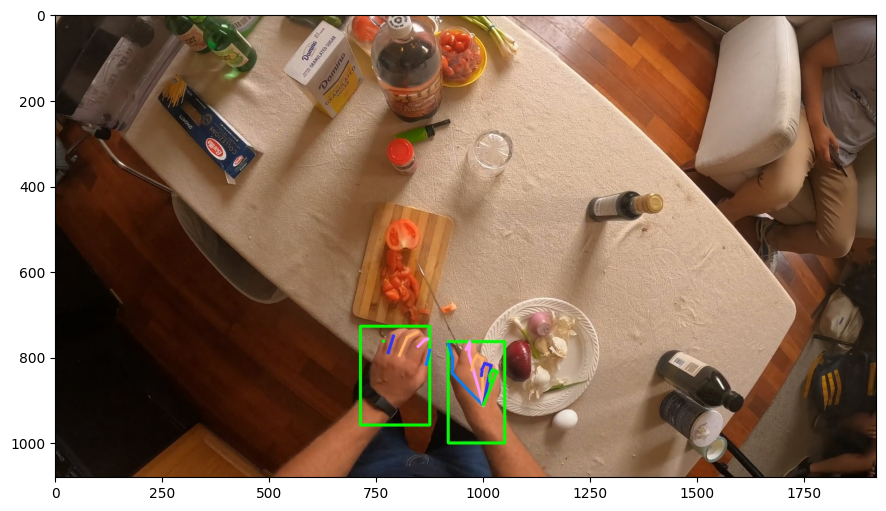

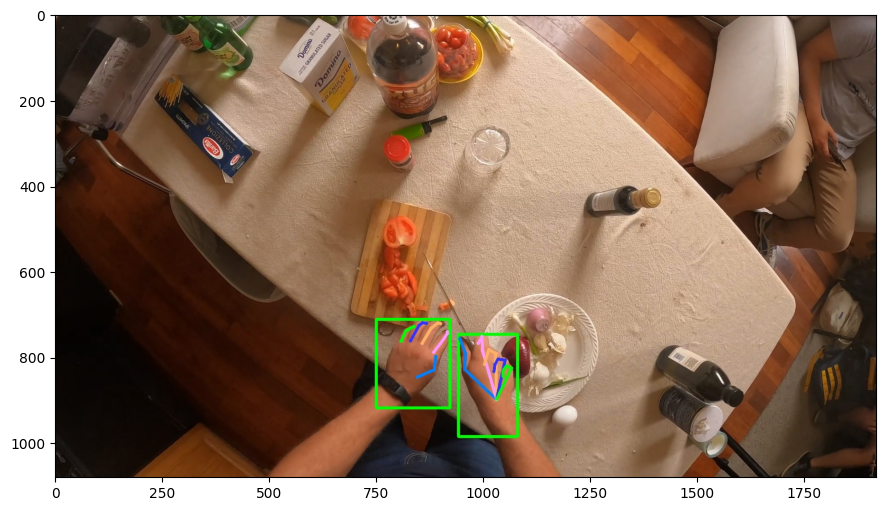

In [53]:
# 6. Hand pose2d estimation for manual corrected index images
# Load in updated ego_bbox.pkl
ego_hand_bbox_dir = os.path.join(dataset_dir, f'hand/bbox')
with open(os.path.join(ego_hand_bbox_dir, "ego_bbox.pkl"), "rb") as f:
        ego_hand_bboxes = pickle.load(f)

ego_hand_pose2d_dir = os.path.join(dataset_dir, f'hand/pose2d')
with open(os.path.join(ego_hand_pose2d_dir, "ego_pose2d.pkl"), "rb") as f:
        ego_hand_pose2d = pickle.load(f)

############################## CHANGE ##############################
kpts_vis_threshold = 0.3
vis_pose2d_dir = os.path.join(dataset_dir, f'hand/vis_pose2d/visThresh={kpts_vis_threshold}', ego_cam_name)
####################################################################

for curr_idx in tqdm([296, 297]): # CHANGE THIS!!!!
    image_path = dset[curr_idx]
    ######### Load bbox from ego_bbox.pkl #########
    right_left_bboxes = ego_hand_bboxes[curr_idx]
    
    ################### Ego camera hand pose2d ###################
    # Format hand bbox
    two_hand_bboxes = [{'bbox':np.append(curr_hand_bbox,1)} for curr_hand_bbox in right_left_bboxes]
    # Hand pose estimation
    pose_results = hand_pose_model.get_poses2d(
                        bboxes=two_hand_bboxes,
                        image_name=image_path,
                    )
    # Save result
    curr_pose2d_kpts = np.array([res['keypoints'] for res in pose_results])
    ego_hand_pose2d[curr_idx] = curr_pose2d_kpts

    # Visualization of hand pose2d
    # save_path = os.path.join('transfer_test', 'ego_pose2d_vis_manualCorrect.jpg')
    save_path = os.path.join(vis_pose2d_dir, f'{curr_idx:06d}.jpg')
    vis_twoHand = cv2.imread(image_path)
    hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand, save_path)
    vis_twoHand = cv2.imread(save_path)
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand, save_path)
    vis_pose2d = cv2.imread(save_path)
    plt.figure(figsize=(12,6))
    plt.imshow(vis_pose2d[:,:,::-1])

In [54]:
with open(os.path.join(ego_hand_pose2d_dir, "ego_pose2d_new.pkl"), "wb") as f:
    pickle.dump(ego_hand_pose2d, f)

#### Hand pose3d estimation with exo cameras

In [ ]:
########### Parameter ###########
scenario = '0324_Piano_1'
test_dataset = 'dataset'
test_case = 'COCOWholeBody_pose2d=0.3_pose3d=0.3'
#################################

# Directory setup and load parameters
dataset_root = '/mnt/shared/ego4dData/cache'
dataset_dir = os.path.join(dataset_root, scenario, 'dataset')
calib_result_dir = os.path.join(dataset_root, scenario, 'dataset/calib_results')
exo_cam_names = ['cam01','cam02','cam03','cam04']

# Load hand pose2d keypoints from both cam and aria
exo_pose2d_file = os.path.join(dataset_dir, f'hand/{test_case}/pose2d', "exo_pose2d.pkl")
assert os.path.exists(exo_pose2d_file), f"{exo_pose2d_file} does not exist"
with open(exo_pose2d_file, "rb") as f:
    exo_poses2d = pickle.load(f)

# Set up image path loader
dset = {curr_cam : sorted(glob.glob(os.path.join(dataset_dir, 'frames', curr_cam, '*'))) for curr_cam in exo_cam_names}
# check number of images are consistent across different camera groups
num_img = len(dset[next(iter(dset))])
assert all(len(dset[k]) == num_img for k in dset), "Not all cameras have same number of images"

# Load in hand pose detector
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(hand_pose_config, 
                            hand_pose_ckpt, 
                            rgb_keypoint_thres=0.3, 
                            rgb_keypoint_vis_thres=0.05,
                            refine_bbox=False)

**demo: create customized cameras**

In [ ]:
#########################
curr_cam_name = 'cam02'
#########################

# Load extrinsics and intrinsics
extri_raw = json.load(open(os.path.join(calib_result_dir, f'{curr_cam_name}_extri.json')))
extrinsics = np.array(extri_raw['T_camera_world'])
# Load intrinsics
intri_raw = json.load(open(os.path.join(calib_result_dir, f'{curr_cam_name}_intri.json')))
intrinsics = np.zeros(8)
intrinsics[0], intrinsics[1] = intri_raw['f'], intri_raw['f'] # f_x,f_y
intrinsics[2], intrinsics[3] = float(intri_raw['width'])/2 + float(intri_raw['cx']), float(intri_raw['height'])/2 + float(intri_raw['cy']) # c_x,c_y
intrinsics[4],intrinsics[5],intrinsics[6] = intri_raw['k1'], intri_raw['k2'], intri_raw['k3'] # k_1,k_2,k_3,k_4
# Camera data template
camera_data_keys = ['name', 'center', 'T_device_world', 'T_world_device', 'T_device_camera', 'T_camera_device', 'camera_type', 'device_row']
curr_camera_data = {k:None for k in camera_data_keys}
curr_camera_data['name'] = curr_cam_name
curr_camera_data['extrinsics'] = extrinsics
# Image shape input
curr_img = cv2.imread(dset[curr_cam_name][0])
img_shape = curr_img.shape[:2]
curr_camera = create_customized_camera(curr_camera_data, intrinsics, img_shape)

In [ ]:
def camera_data_from_json(extr_dir, intri_dir, time_stamp=None, ego=False):
    # Load extrinisc from json file
    if not ego:
        extri_raw = json.load(open(extr_dir))
        extrinsics = np.array(extri_raw['T_camera_world'])
    else:
        extri_raw = json.load(open(extr_dir))
        # index extrinsics with time_stamp
        curr_key = sorted(list(extri_raw.keys()))[time_stamp]
        extrinsics = np.array(extri_raw[curr_key]['T_camera_world'])
    
    # Load intrinsic from json file 
    intri_raw = json.load(open(intri_dir))
    intrinsics = np.zeros(8)
    intrinsics[0], intrinsics[1] = intri_raw['f'], intri_raw['f'] # f_x,f_y
    intrinsics[2], intrinsics[3] = float(intri_raw['width'])/2 + float(intri_raw['cx']), float(intri_raw['height'])/2 + float(intri_raw['cy']) # c_x,c_y
    intrinsics[4],intrinsics[5],intrinsics[6] = intri_raw['k1'], intri_raw['k2'], intri_raw['k3'] # k_1,k_2,k_3,k_4
    # Camera data template
    camera_data_keys = ['name', 'center', 'T_device_world', 'T_world_device', 'T_device_camera', 'T_camera_device', 'camera_type', 'device_row']
    curr_camera_data = {k:None for k in camera_data_keys}
    curr_camera_data['name'] = curr_cam_name
    curr_camera_data['extrinsics'] = extrinsics

    return curr_camera_data, intrinsics

In [ ]:
ego_cam_extr = json.load(open('/mnt/shared/ego4dData/cache/0324_Piano_1/dataset/calib_results/cam05_extri_cropId_000.json'))

In [ ]:
sorted(list(ego_cam_extr.keys()))

In [ ]:
a = np.random.rand(4,3)
a

In [ ]:
a[[2,3],2] = 1000
a

#### Multiview stitched pose estimation visualization

**Exo camera pose3d & pose2d visualization**

In [69]:
########### Parameter ###########
scenario = '0630_Cooking_4'
kpts_vis_threshold = 0.3
#################################

# Image directories
vis_pose_root = f'/mnt/shared/ego4dData/cache/{scenario}/dataset/hand/vis_pose2d/visThresh={kpts_vis_threshold}'
vis_cam_name = sorted(os.listdir(vis_pose_root)) # ['cam01','cam02','cam03','cam04', 'cam05']
dataset_dir = {curr_cam : sorted(glob.glob(os.path.join(vis_pose_root, curr_cam, '*'))) for curr_cam in vis_cam_name}
num_img = len(dataset_dir[vis_cam_name[0]])
# Visualization save directory
save_dir = os.path.join(vis_pose_root, 'Multiview')
os.makedirs(save_dir, exist_ok=True)

In [81]:
H, W = cv2.imread(dataset_dir[vis_cam_name[0]][0]).shape[:2]
num_row = (len(vis_cam_name) - 1)//2 + 1
num_col = 2
total_height, total_width = num_row*H, num_col*W

# Iterate through all images
for idx in tqdm(range(num_img)):
    canvas = 255 * np.ones((total_height, total_width, 3))
    for img_idx, curr_cam_name in enumerate(vis_cam_name):
        curr_img_dir = dataset_dir[curr_cam_name][idx]
        camera_image = cv2.imread(curr_img_dir)

        # Append current image into canvas
        row_idx = img_idx // num_col
        col_idx = img_idx % num_col

        origin_x = W * col_idx
        origin_y = H * row_idx
        canvas[origin_y:origin_y+H, origin_x:origin_x+W, :] = camera_image

    # Save result
    # canvas = cv2.resize(canvas, (5760,2160))
    cv2.imwrite(os.path.join(save_dir, f'{idx:06d}.jpg'), canvas)

  0%|          | 0/300 [00:00<?, ?it/s]

100%|██████████| 300/300 [03:24<00:00,  1.47it/s]


**Exo & Ego camera pose3d visualization**

In [102]:
########### Parameter ###########
scenario = '0630_Cooking_4'
tri_threshold = 0.3
camera_used = 'ego_exo_camera'
assert camera_used in ['ego_exo_camera', 'exo_camera'], f"cameras_used has to be one of ['ego_exo_camera', 'exo_camera']"
#################################

# Image directories
vis_pose_root = f'/mnt/shared/ego4dData/cache/{scenario}/dataset/hand/vis_pose3d/{camera_used}/triThresh={tri_threshold}'
vis_cam_name = sorted(os.listdir(vis_pose_root))
dataset_dir = {curr_cam : sorted(glob.glob(os.path.join(vis_pose_root, curr_cam, '*'))) for curr_cam in vis_cam_name}
num_img = len(dataset_dir[vis_cam_name[0]])
# Visualization save directory
save_dir = os.path.join(vis_pose_root, 'Multiview')
os.makedirs(save_dir, exist_ok=True)

In [103]:
H, W = cv2.imread(dataset_dir[vis_cam_name[0]][0]).shape[:2]
num_row = (len(vis_cam_name) - 1)//2 + 1
num_col = 2
total_height, total_width = num_row*H, num_col*W

# Iterate through all images
for idx in tqdm(range(num_img)):
    canvas = 255 * np.ones((total_height, total_width, 3))
    for img_idx, curr_cam_name in enumerate(vis_cam_name):
        curr_img_dir = dataset_dir[curr_cam_name][idx]
        camera_image = cv2.imread(curr_img_dir)

        # Append current image into canvas
        row_idx = img_idx // num_col
        col_idx = img_idx % num_col

        origin_x = W * col_idx
        origin_y = H * row_idx
        canvas[origin_y:origin_y+H, origin_x:origin_x+W, :] = camera_image

    # Save result
    # canvas = cv2.resize(canvas, (5760,2160))
    cv2.imwrite(os.path.join(save_dir, f'{idx:06d}.jpg'), canvas)

  0%|          | 0/300 [00:00<?, ?it/s]

100%|██████████| 300/300 [02:29<00:00,  2.01it/s]
